In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp

## Stałe i funkcje pomocniczne

In [2]:
EPS = 1e-10

def r_svd(A, compression):
    # return sp.sparse.linalg.svds(A, compression, solver='propack') - it doesn't work idk
    U, d, V = np.linalg.svd(A)
    U = U[:, :compression]
    d = d[:compression]
    V = V[:compression, :]
    return U, d, V

## Funkcje tworzenia drzewa hierarchicznej kompresji macierzy

In [3]:
from collections import deque

# class for nodes of tree
class Node:
    def __init__(self):
        self.rank = None
        self.region = None
        self.matrix = None
        self.children = set()

    def add_child(self, v):
        self.children.add(v)

# leaf handler
def compress_matrix(A, r_start, r_end, c_start, c_end, U, d, V, compression):
    v = Node()
    v.region = (r_start, r_end, c_start, c_end)
    if np.all(A[r_start:r_end, c_start:c_end] < EPS):
        v.rank = 0
    else:
        v.rank = compression
        v.matrix = U@np.diag(d)@V
    return v

# create tree
def create_tree(A, r_start, r_end, c_start, c_end, compression, threshold):
    # handle cases where compression >= size
    if r_end - r_start <= compression or c_end - c_start <= compression:
        U, d, V = r_svd(A[r_start:r_end, c_start:c_end], min(compression, r_end-r_start, c_end-c_start))
        return compress_matrix(A, r_start, r_end, c_start, c_end, U, d, V, compression)

    U, d, V = r_svd(A[r_start:r_end, c_start:c_end], compression+1)
    if d[-1] < threshold:
        v = compress_matrix(A, r_start, r_end, c_start, c_end, U[:, :-1], d[:-1], V[:-1, :], compression)
    else:
        v = Node()
        r_half = (r_start + r_end) // 2
        c_half = (c_start + c_end) // 2
        v.add_child(create_tree(A, r_start, r_half, c_start, c_half, compression, threshold))
        v.add_child(create_tree(A, r_start, r_half, c_half, c_end, compression, threshold))
        v.add_child(create_tree(A, r_half, r_end, c_start, c_half, compression, threshold))
        v.add_child(create_tree(A, r_half, r_end, c_half, c_end, compression, threshold))
    return v

def get_compressed_matrix(root, shape):
    A = np.zeros(shape)
    
    q = deque()
    q.append(root)
    while len(q) > 0:
        v = q.popleft()
        if len(v.children) > 0:
            for u in v.children:
                q.append(u)
        elif v.rank > 0:
            r0, r1, c0, c1 = v.region
            A[r0:r1, c0:c1] = v.matrix

    return A

## Funkcje rysujące

In [4]:
from matplotlib.patches import Rectangle

def draw_compressed_matrices(roots, titles, shape):
    fig, axes = plt.subplots(2, 2)
    fig.set_size_inches(14, 14)
    for root, title, ax in zip(roots, titles, np.atleast_1d(axes).reshape(-1)):
        ax.axis("off")
        ax.set_title(title)

        q = deque()
        q.append(root)
        while len(q) > 0:
            v = q.popleft()
            if len(v.children) > 0:
                for u in v.children:
                    q.append(u)
            elif v.rank > 0:
                y0, y1, x0, x1 = v.region
                rect1 = Rectangle((x0, y0), x1-x0, y1-y0, fill=False, lw=1)
                rect2 = Rectangle((x0, y0), v.rank, y1-y0, fill=True, fc='black', lw=1)
                rect3 = Rectangle((x0, y0), x1-x0, v.rank, fill=True, fc='black', lw=1)
                ax.add_patch(rect1)
                ax.add_patch(rect2)
                ax.add_patch(rect3)

        ax.set_xlim(0, shape[0])
        ax.set_ylim(0, shape[1])
    axes[-1,-1].axis("off")
    plt.show()

def draw_images(images, titles, cmaps):
    fig, axes = plt.subplots(2, 2)
    fig.set_size_inches(14, 14)
    for image, title, cmap, ax in zip(images, titles, cmaps, np.atleast_1d(axes).reshape(-1)):
        ax.axis("off")
        ax.set_title(title)
        ax.imshow(image, cmap=cmap)
    plt.show()

def draw_singulars(singularss, colors, markers):
    plt.figure(figsize = (12,6))
    for singulars, color, marker in zip(singularss, colors, markers):
        plt.plot(np.arange(1, len(singulars)+1, 1), singulars, label=f"Wartości osobliwe - {color}", color=color, linestyle='', marker=marker)
    plt.yscale("log")
    plt.title("Wartości osobliwe dla bitmap R, G, B")
    plt.xlabel("index")
    plt.ylabel("singular value")
    plt.grid()
    plt.legend()
    plt.show()

## Wczytanie i pokazanie obrazka

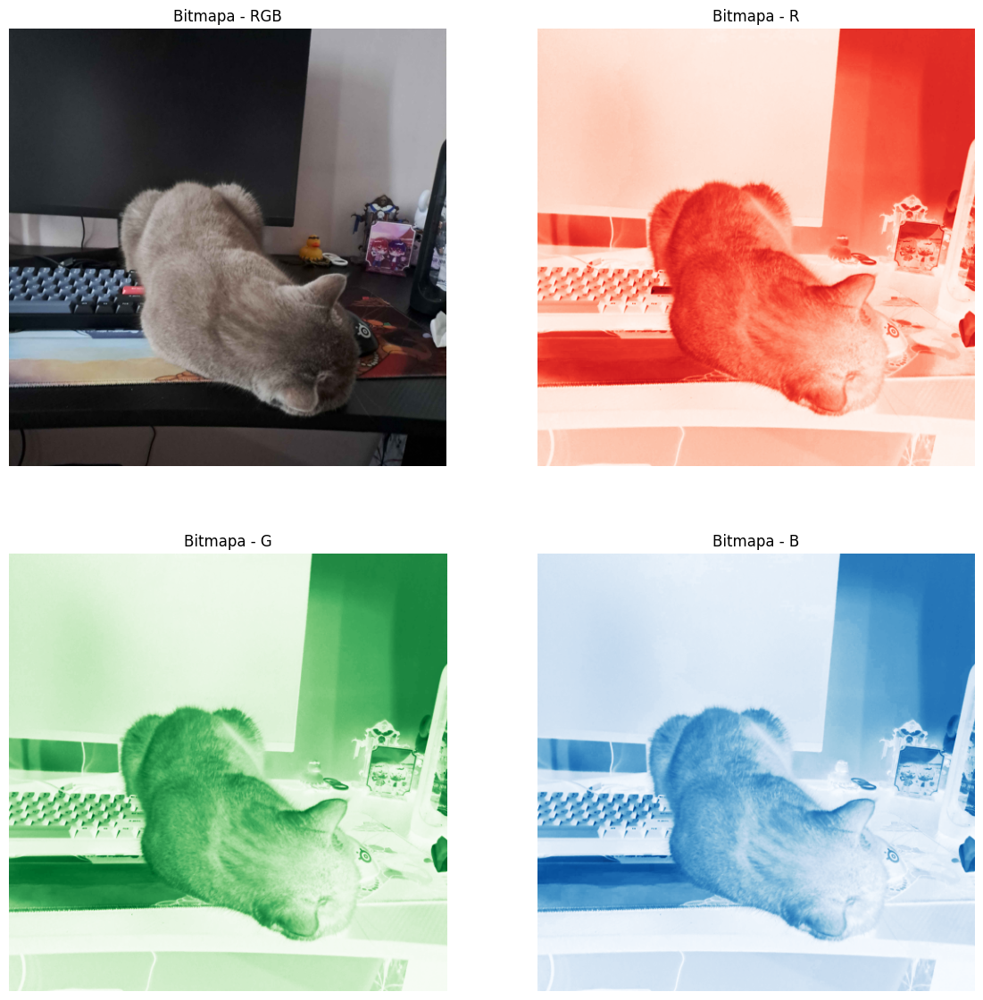

In [5]:
from skimage import io

RGB = io.imread("image.png")
R, G, B = RGB[:, :, 0], RGB[:, :, 1], RGB[:, :, 2]
shape = R.shape
draw_images([RGB, R, G, B], ["Bitmapa - RGB", "Bitmapa - R", "Bitmapa - G", "Bitmapa - B"], [None, 'Reds', 'Greens', 'Blues'])

## Narysowanie wartości 

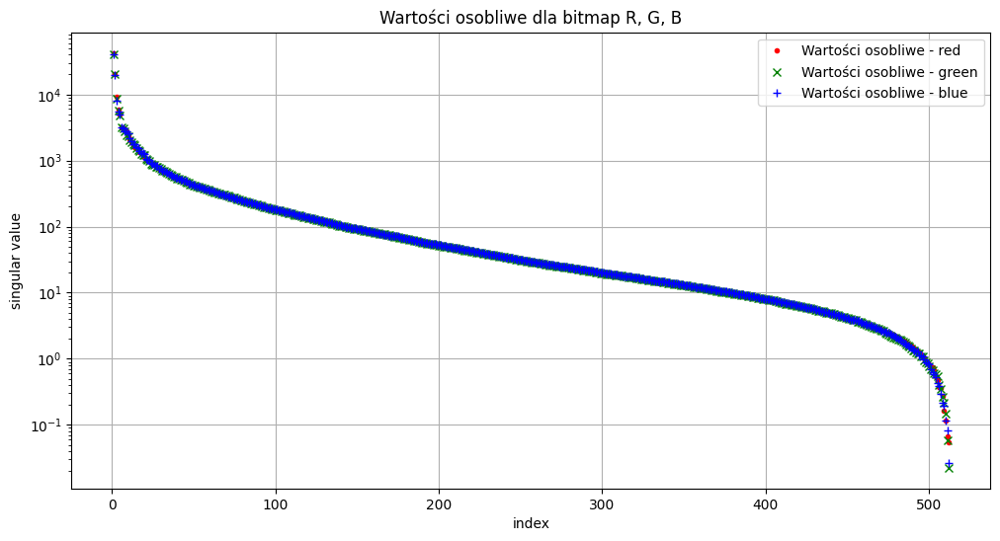

In [6]:
singulars_R = np.linalg.svd(R, compute_uv=False)
singulars_G = np.linalg.svd(G, compute_uv=False)
singulars_B = np.linalg.svd(B, compute_uv=False)
draw_singulars([singulars_R, singulars_G, singulars_B], ["red", "green", "blue"], ['.', 'x', '+'])

## Kompresja

In [7]:
compressions = [1, 4]
thresholds = [0, shape[0]-1, shape[0]//2]

In [8]:
colors_dict = {}
for color, A, singulars in zip(["R", "G", "B"], [R, G, B], [singulars_R, singulars_G, singulars_B]):
    colors_dict[color] = (A, singulars)

In [9]:
results = {}

def result_key(color, compression, threshold):
    return f"{color}_{compression}_{threshold}"

for color in colors_dict.keys():
    A, singulars = colors_dict.get(color)
    for compression in compressions:
        for threshold_index in thresholds:
            threshold = singulars[threshold_index]
            key = result_key(color, compression, threshold_index)
            results[key] = create_tree(A, 0, shape[0]-1, 0, shape[1]-1, compression, threshold)

## Narysowanie wyników

In [10]:
# draw complete result
def draw_result(compression, threshold):
    roots_dict = {}
    for color in colors_dict.keys():
        key = result_key(color, compression, threshold)
        roots_dict[color] = results.get(key)

    # draw compressed matrices
    roots = list()
    titles = list()
    for color, root in roots_dict.items():
        roots.append(root)
        titles.append(f"Macierz kompresji - {color}")
    draw_compressed_matrices(roots, titles, shape)

    # draw compressed images
    images = list()
    titles = list()
    cmaps = list()
    color_to_cmap = {"R": "Reds", "G": "Greens", "B": "Blues"}
    rgb_img = np.zeros((shape[0],shape[1],3))
    color_to_index = {"R": 0, "G": 1, "B": 2}
    for color, root in roots_dict.items():
        img = get_compressed_matrix(root, shape) / 255
        images.append(img)
        titles.append(f"Skompresowana bitmapa - {color}")
        cmaps.append(color_to_cmap[color])
        rgb_img[:, :, color_to_index[color]] = img
    images.append(rgb_img)
    titles.append("Skompresowana bitmapa - RGB")
    cmaps.append(None)
    draw_images(images, titles, cmaps)

### Wyniki dla kompresji = 1 i progu $\sigma_0$

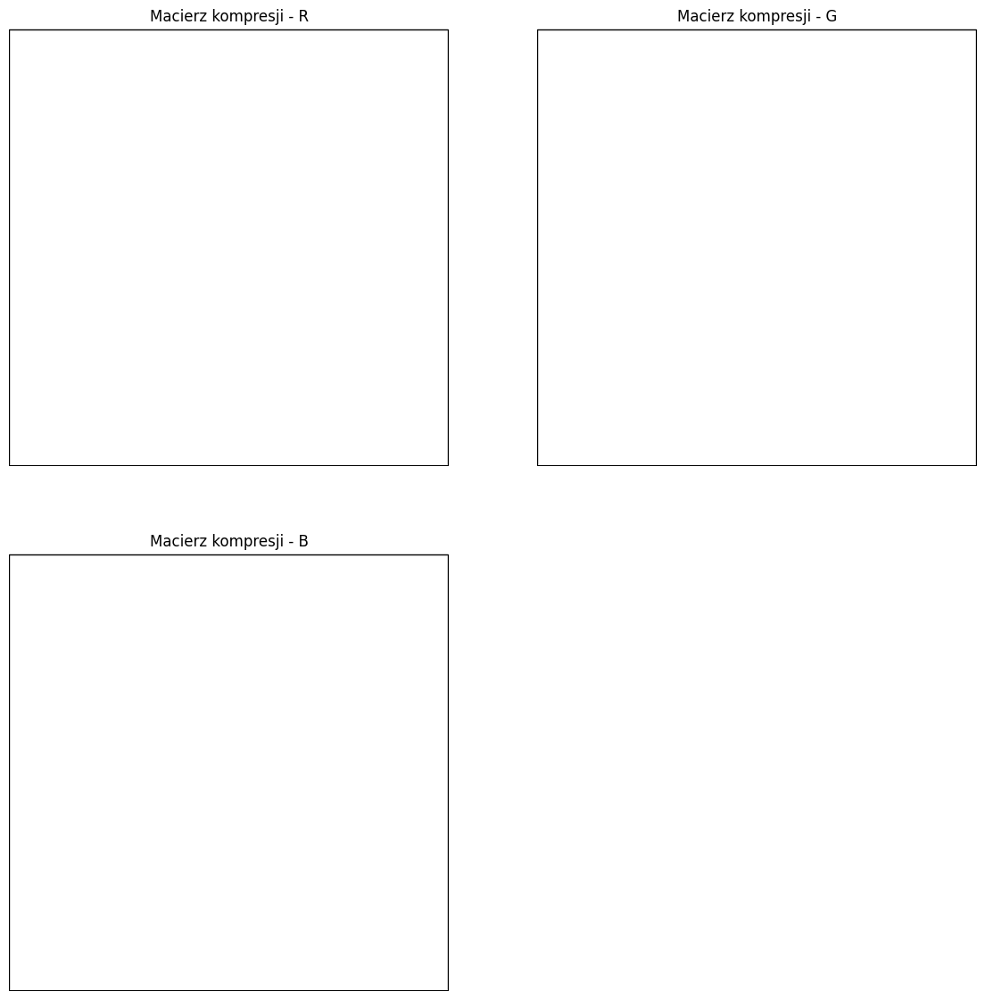

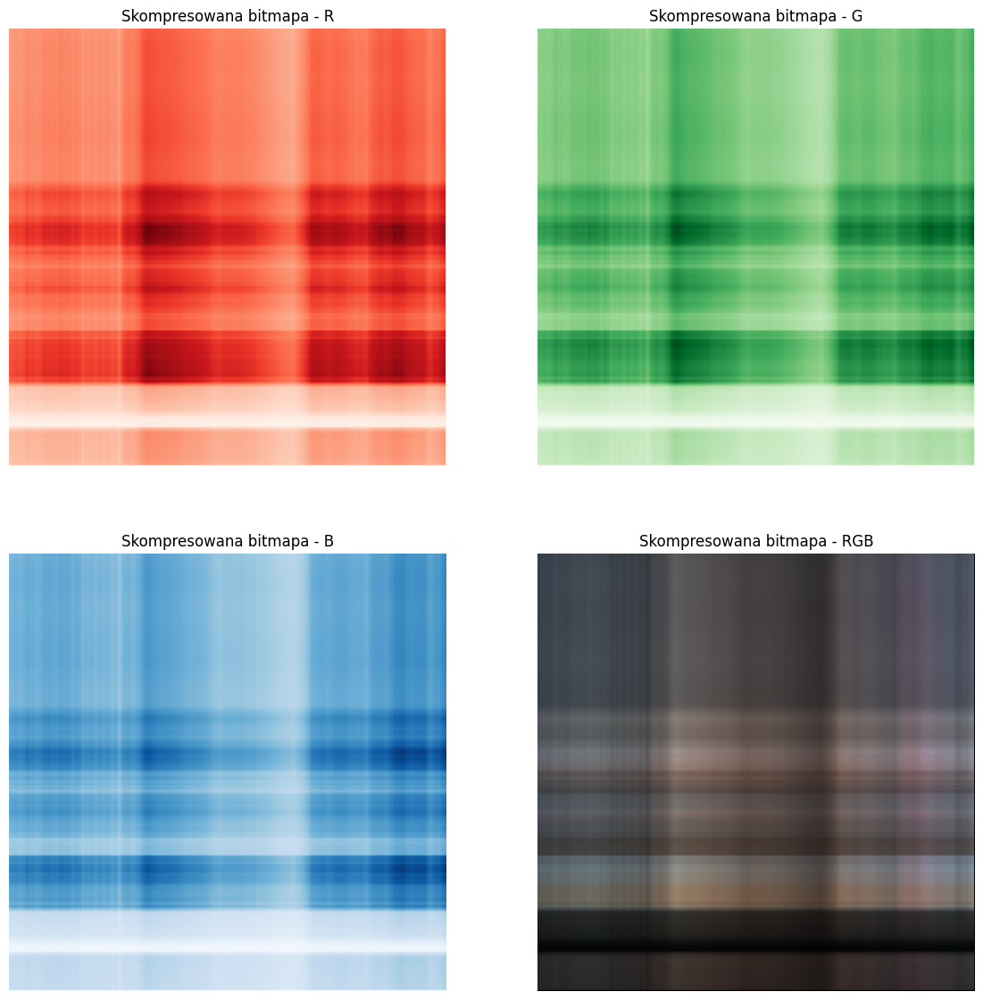

In [11]:
draw_result(1, 0)

### Wyniki dla kompresji = 1 i progu $\sigma_{n-1}$

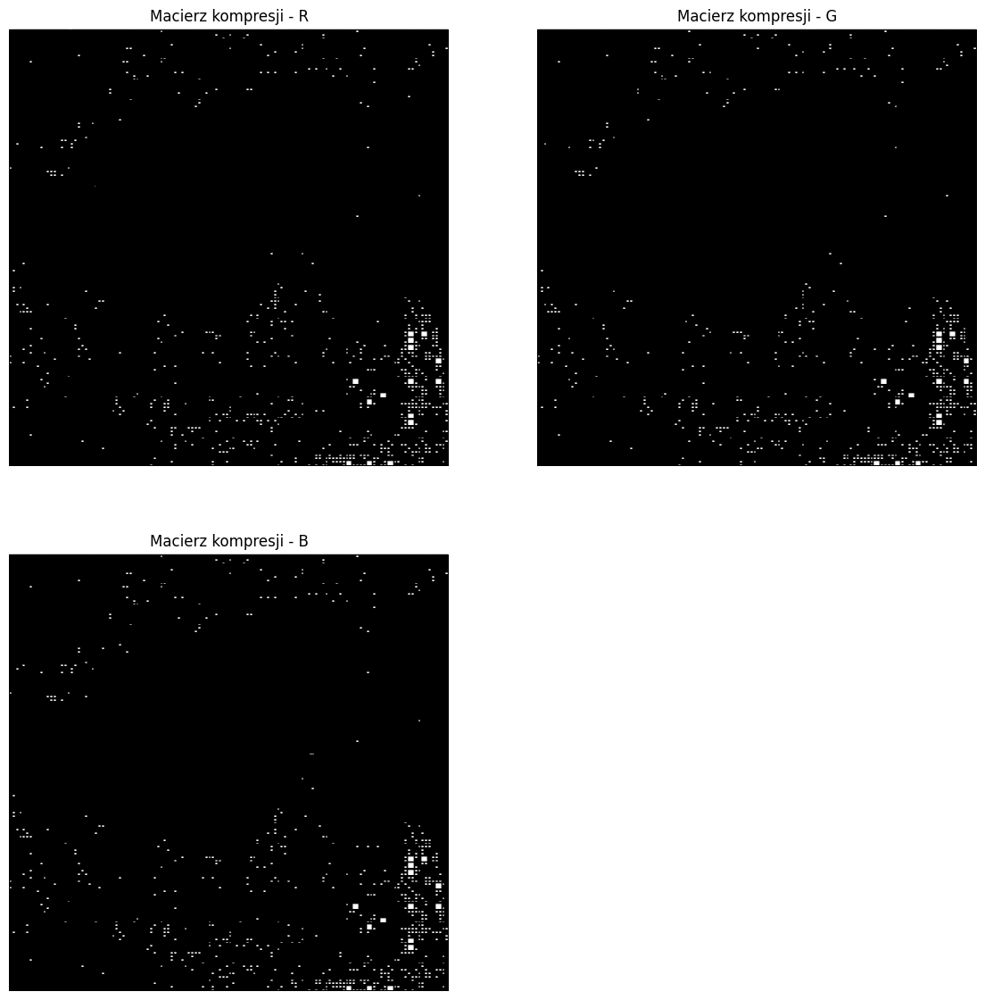

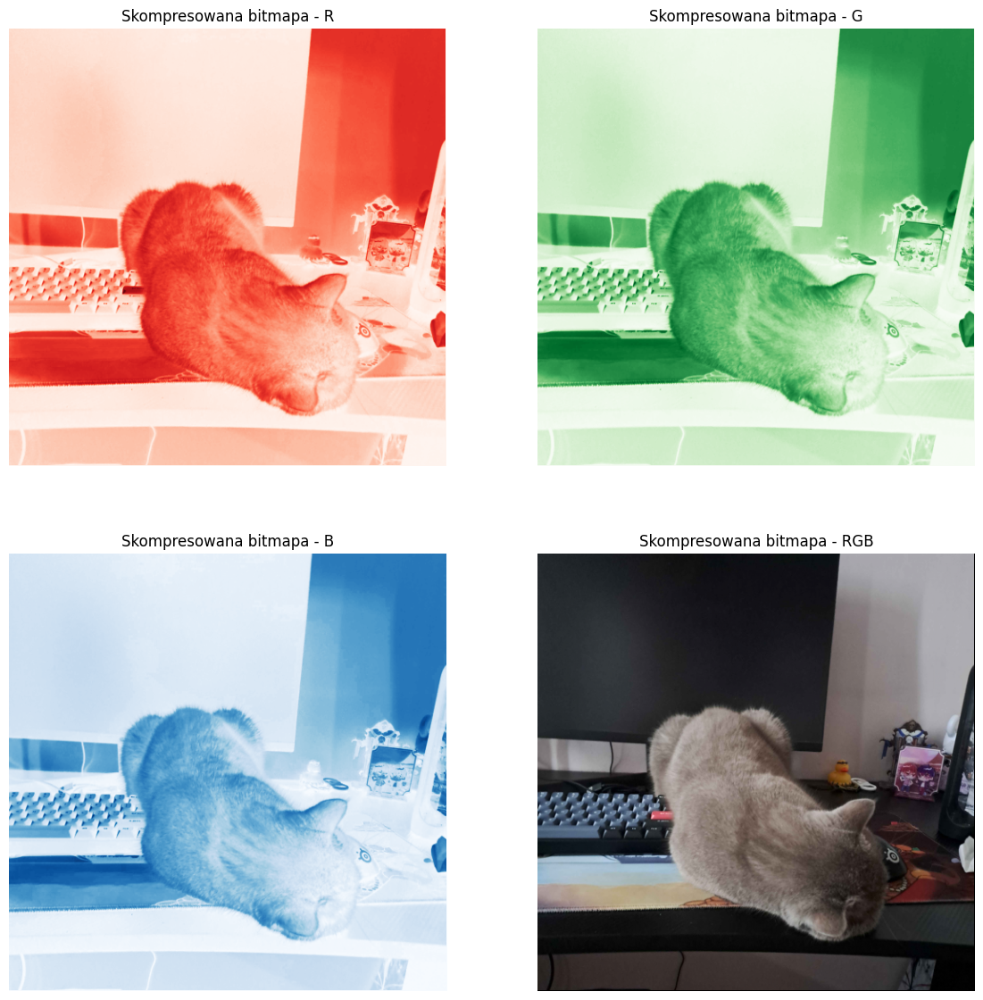

In [12]:
draw_result(1, shape[0]-1)

### Wyniki dla kompresji = 1 i progu $\sigma_{n/2}$

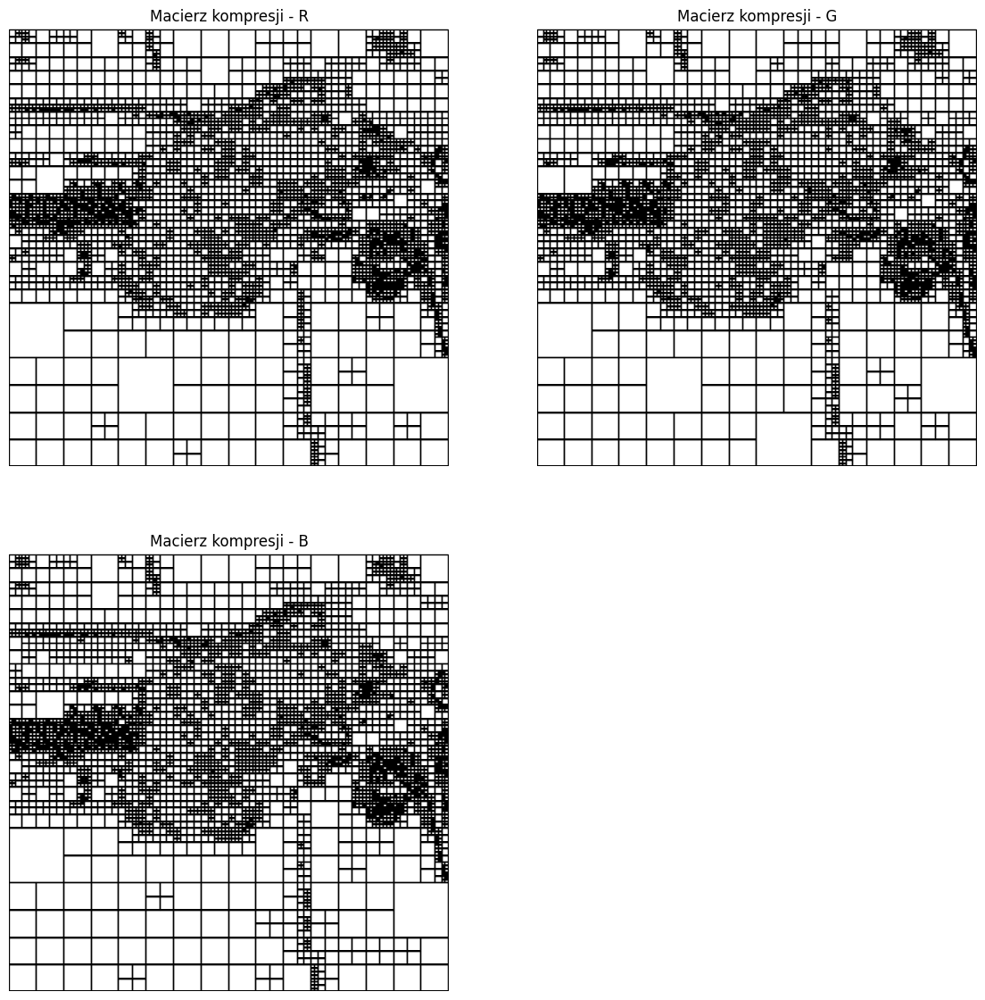

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0215544513543815].


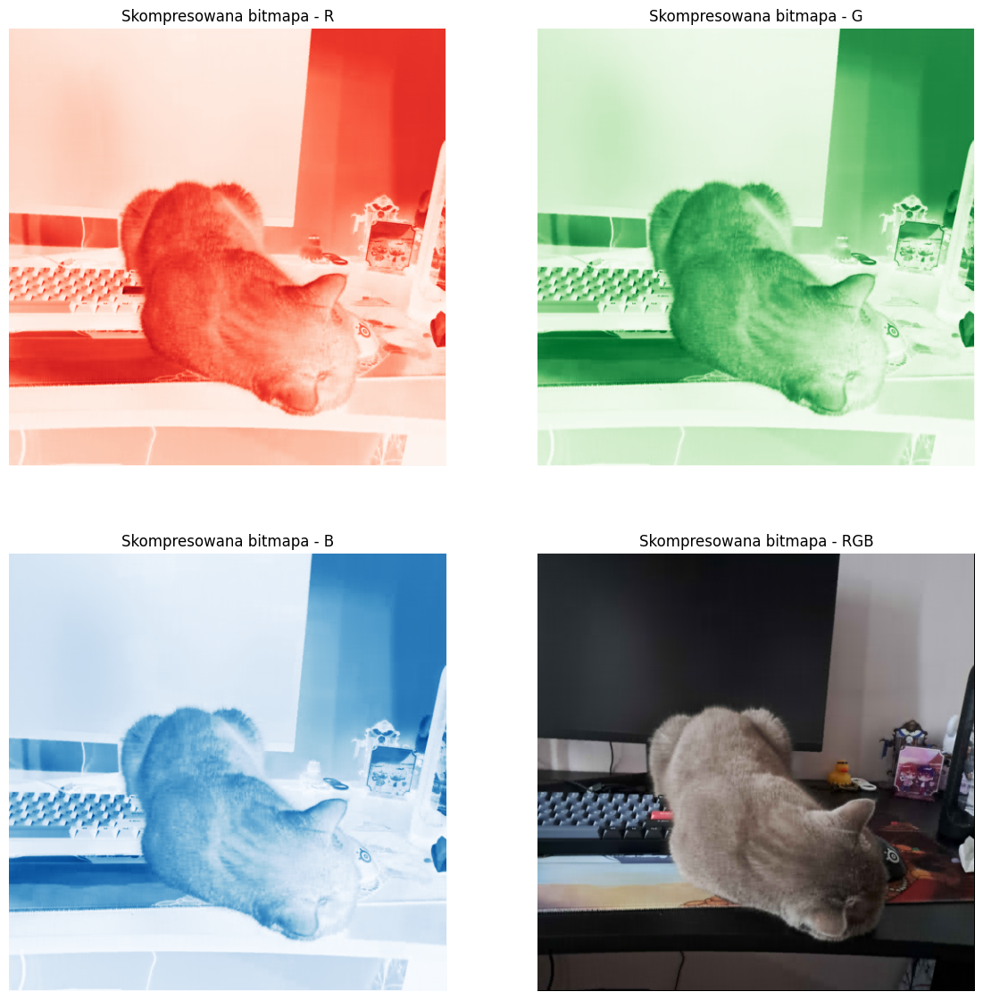

In [13]:
draw_result(1, shape[0]//2)

### Wyniki dla kompresji = 4 i progu $\sigma_0$

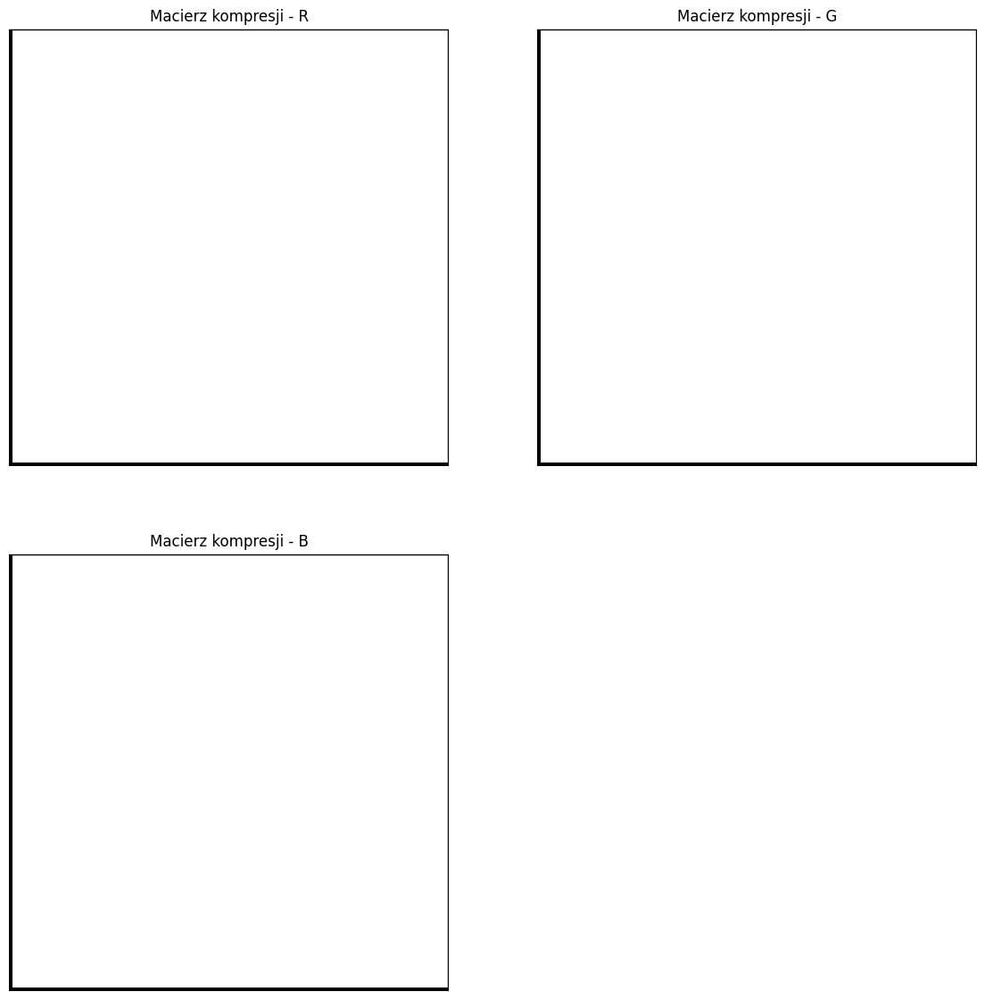

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08529784471359017..0.9057735088081212].


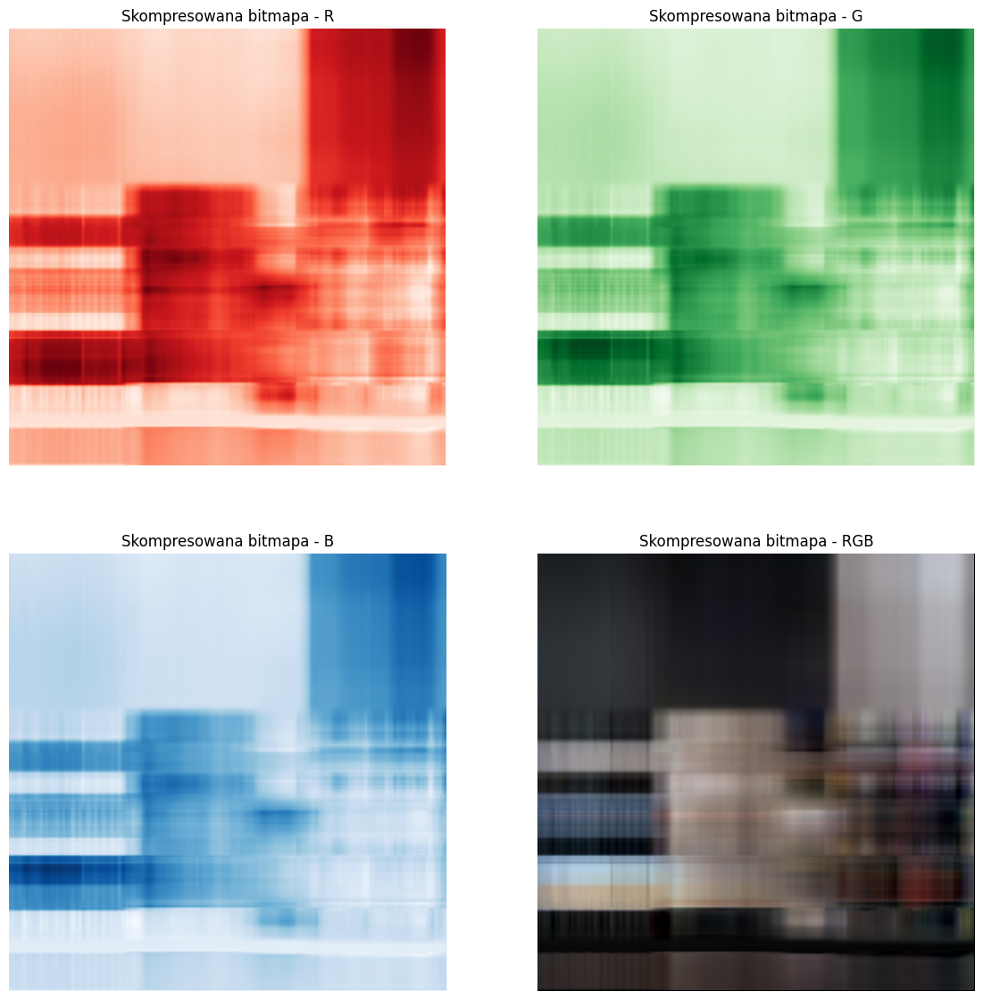

In [14]:
draw_result(4, 0)

### Wyniki dla kompresji = 4 i progu $\sigma_{n-1}$

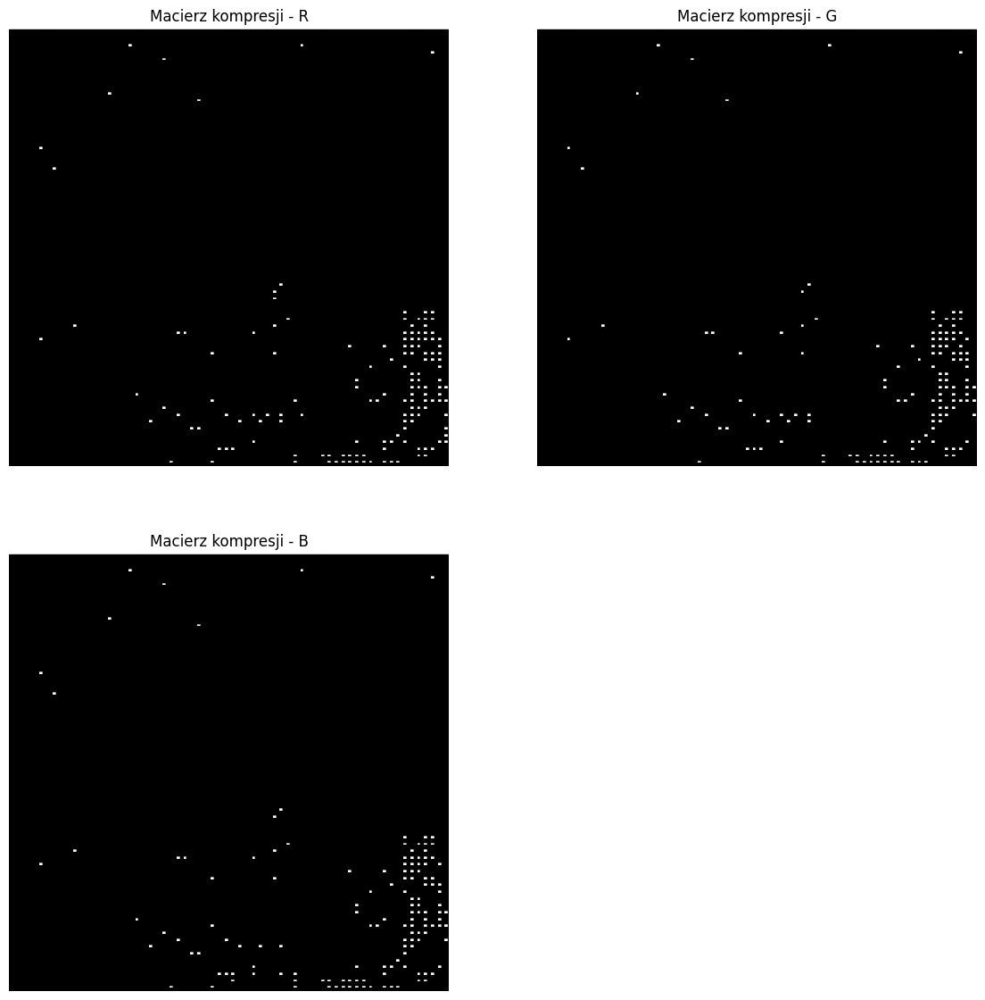

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.767850251424249e-17..0.9960784313725505].


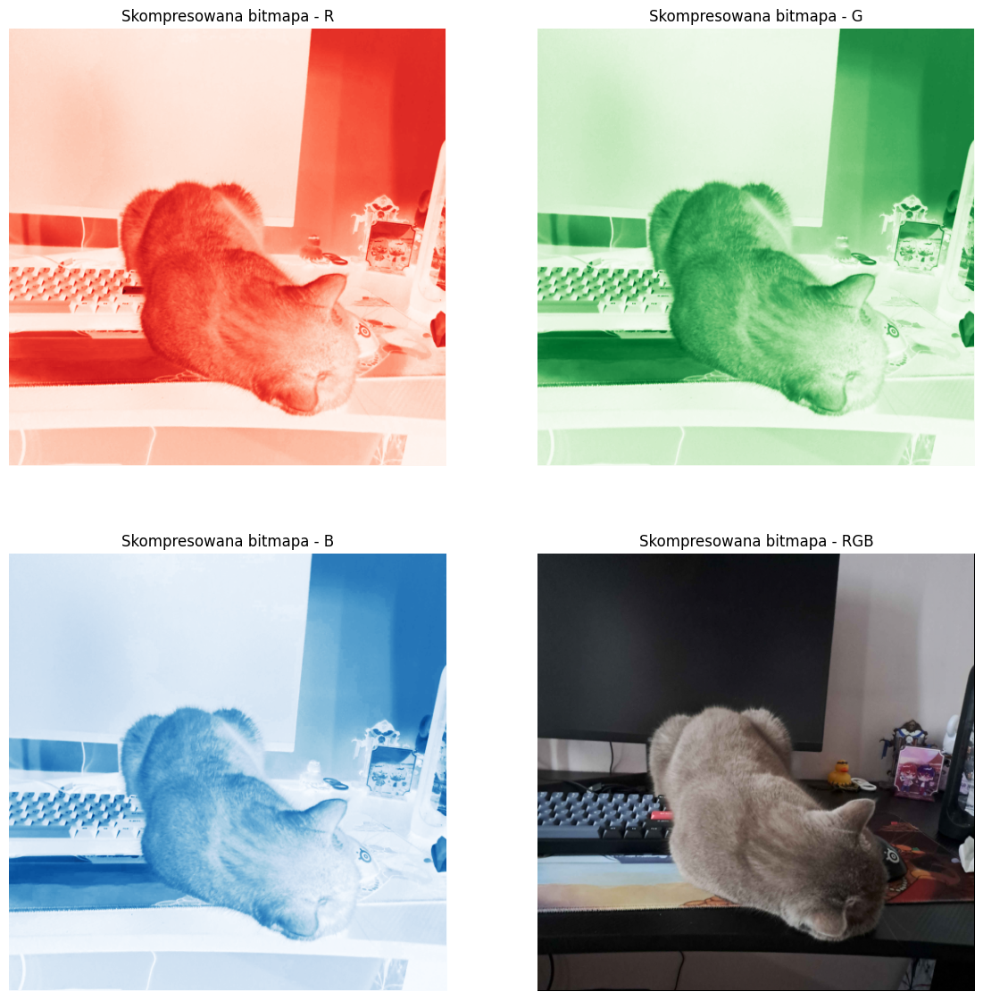

In [15]:
draw_result(4, shape[0]-1)

### Wyniki dla kompresji = 4 i progu $\sigma_{n/2}$

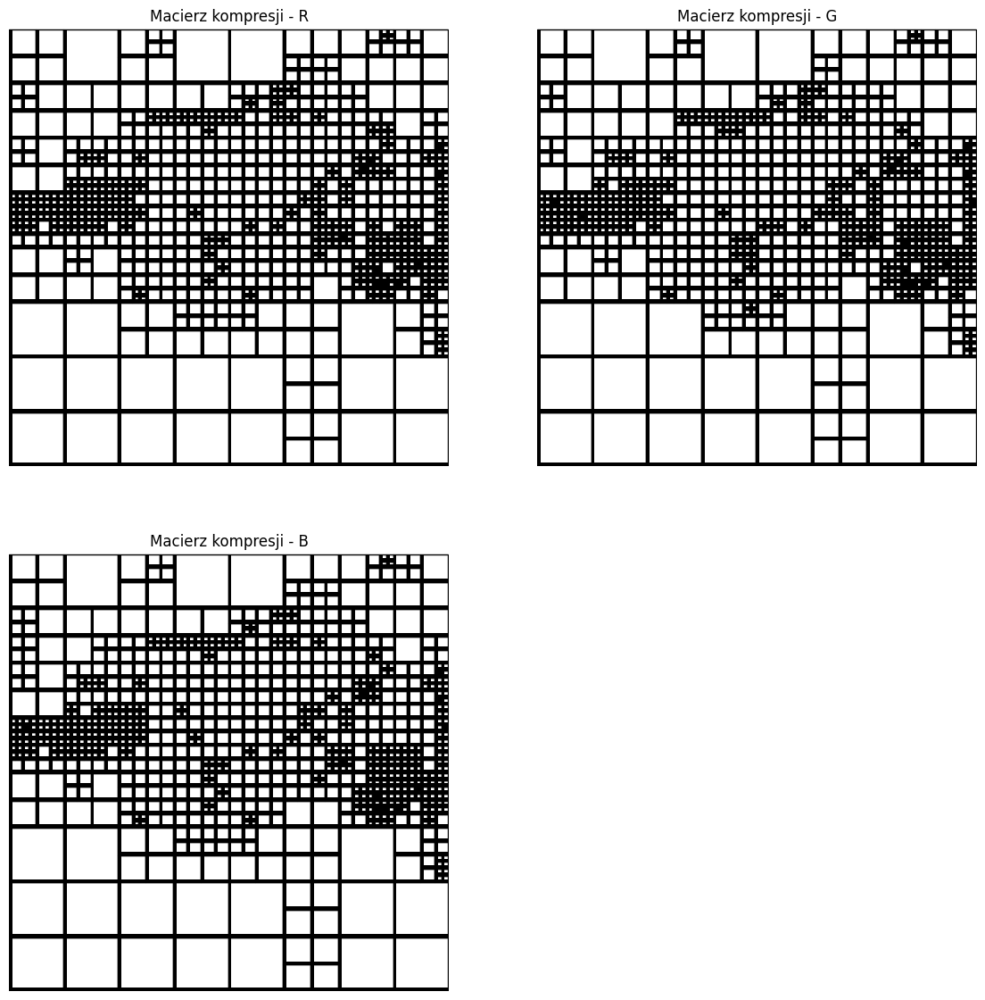

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024050403687237123..0.9960936957677691].


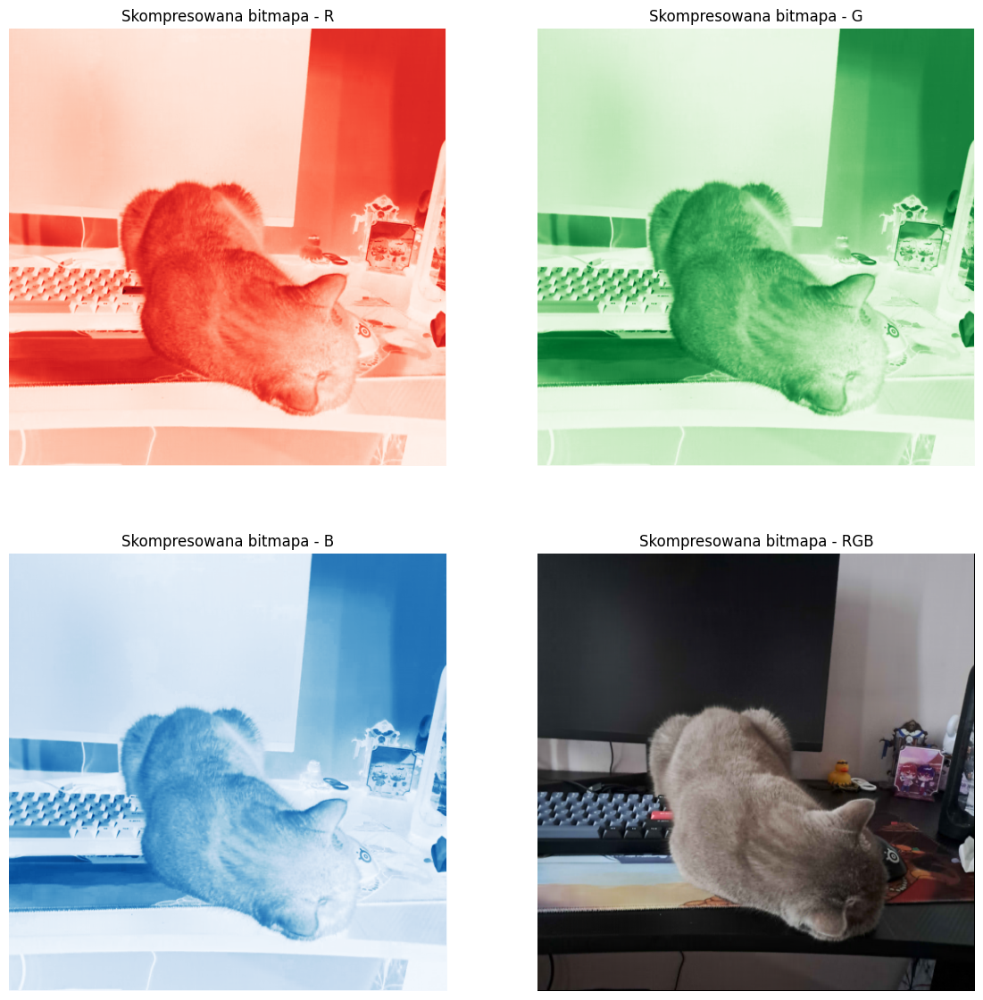

In [16]:
draw_result(4, shape[0]//2)

## Dopasowanie parametrów

In [17]:
comp = 3
thr = shape[0]//3

In [18]:
for color in colors_dict.keys():
    A, singulars = colors_dict.get(color)
    threshold = singulars[thr]
    key = result_key(color, comp, thr)
    results[key] = create_tree(A, 0, shape[0]-1, 0, shape[1]-1, comp, threshold)

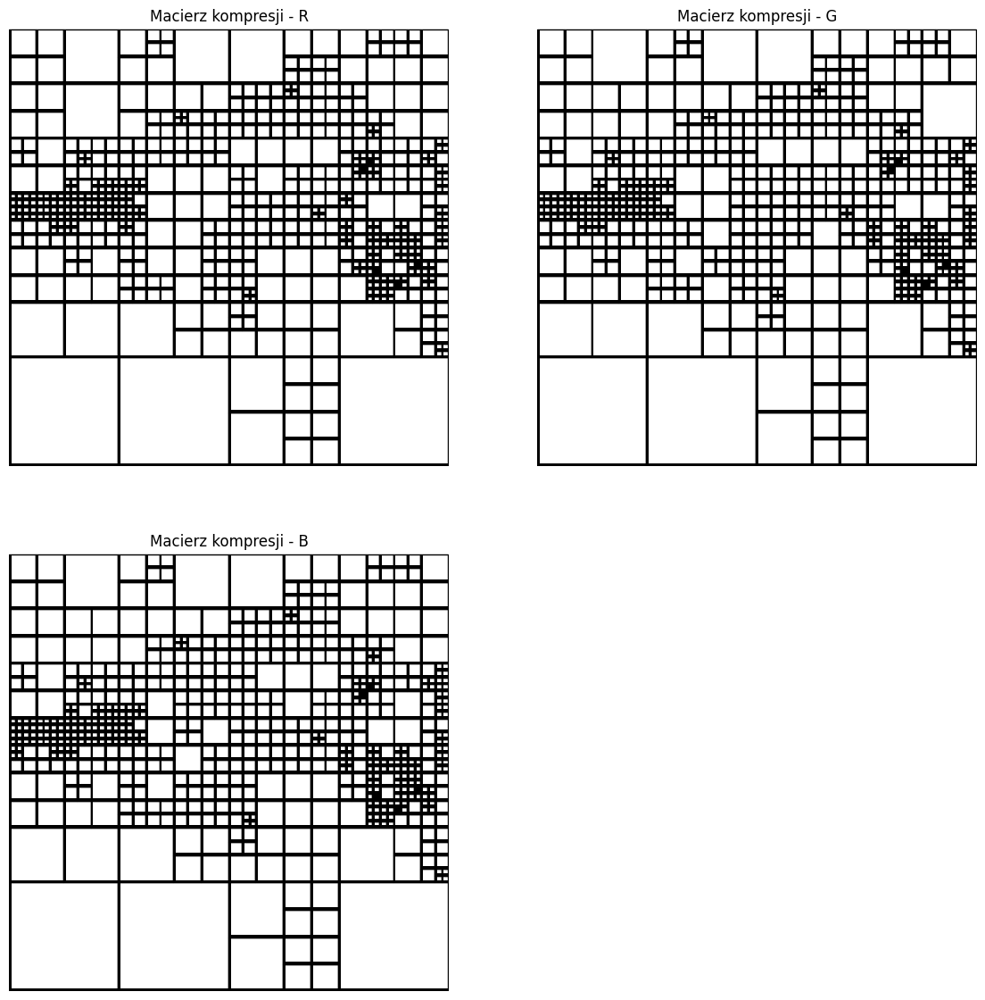

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05215400302451732..0.9962168019910934].


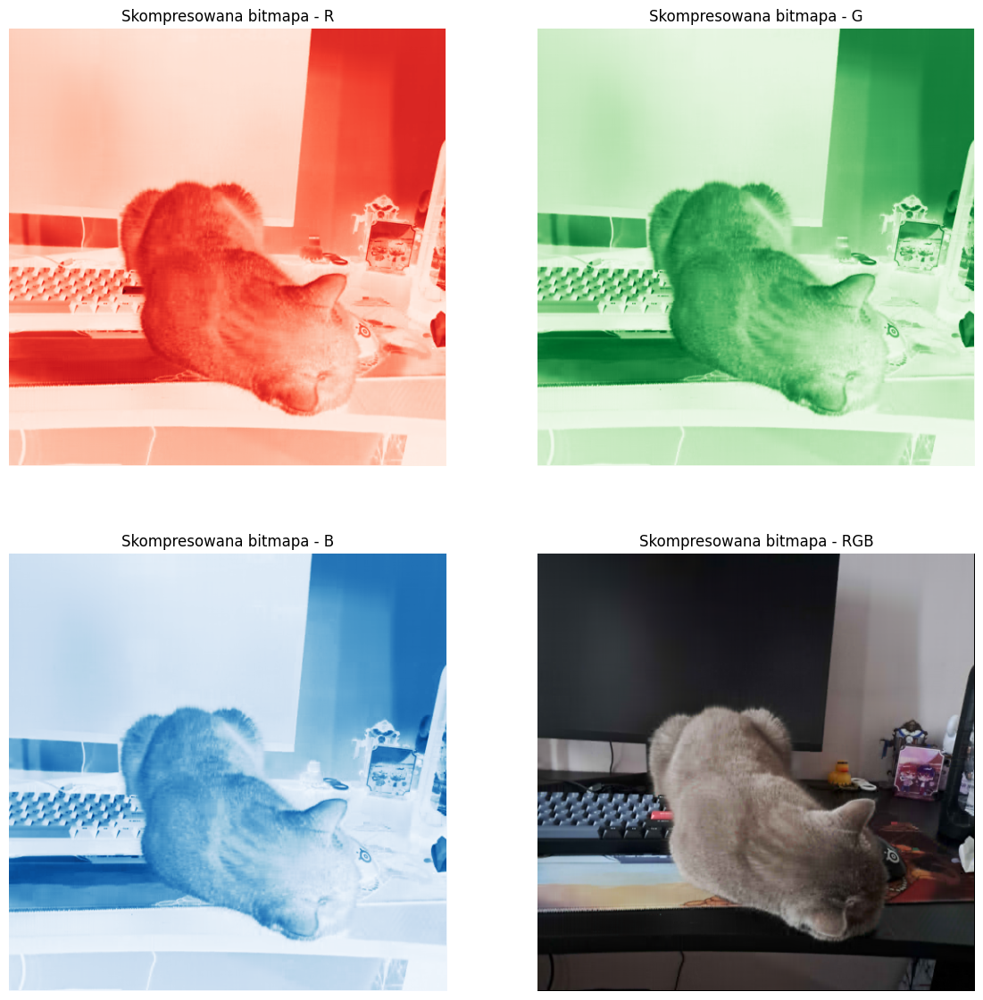

In [19]:
draw_result(comp, thr)